In [2]:
import os
import mne
import numpy as np
import sys
import pandas as pd
import logging
from enum import Enum
from typing import Optional, Generator
from collections import namedtuple
from mne import channels, evoked, create_info
import matplotlib.pyplot as plt
# from deepmeg.utils.params import SpatialParameters, TemporalParameters, ComponentsOrder, Predictions, WaveForms
sys.path.insert(1, os.path.realpath(os.path.pardir))
from utils.preprocessing import BasicPreprocessor
from utils.storage import DLStorageIterator, STAGE
from deepmeg.utils.params import Predictions, read_pkl
from deepmeg.preprocessing.transforms import one_hot_decoder
import scipy as sp


from deepmeg.utils.convtools import conviter

def sensitivity(y_true, y_pred):
    true_positives = sum((yt == 1 and yp == 1) for yt, yp in zip(y_true, y_pred))
    actual_positives = sum(yt == 1 for yt in y_true)

    if actual_positives == 0:
        return 0.0

    return true_positives / actual_positives

def specificity(y_true, y_pred):
    true_negatives = sum((yt == 0 and yp == 0) for yt, yp in zip(y_true, y_pred))
    actual_negatives = sum(yt == 0 for yt in y_true)

    if actual_negatives == 0:
        return 0.0

    return true_negatives / actual_negatives

def moving_average(data, win=5):
    acc = list()
    for k, _, _ in conviter(data.shape, (win,), 'same'):
        acc.append(data[k].mean())
    return np.array(acc)


def moving_measure(y_true, y_pred, measure, win=5):
    scores = list()
    for k, _, _ in conviter(y_true.shape, (win,), 'same'):
        scores.append(measure(y_true[k], y_pred[k]))
    return scores


def balance_df(df: pd.DataFrame, target_col: str) -> tuple[pd.DataFrame, pd.Series]:
    classes, classes_samples = np.unique(df[target_col], return_counts=True)
    smallest_class = classes[np.argsort(classes_samples)][0]
    samples = classes_samples.min()
    df_list = []
    stat = {class_: 0 for class_ in classes}

    for index, row in df.iterrows():
        y = row[target_col]
        if y != smallest_class and stat[y] >= samples:
            continue
        else:
            df_list.append(row)
            stat[y] += 1

    balanced_df = pd.DataFrame(df_list)

    return balanced_df


import pandas as pd
import matplotlib.pyplot as plt

def plot_confusion_matrix(confusion_matrix_df: pd.DataFrame, title: str = "Confusion Matrix Heatmap", cbar: bool = False) -> plt.Figure:
    """
    Visualize a confusion matrix stored in a pandas DataFrame using a heatmap.

    Args:
        confusion_matrix_df (pd.DataFrame): Confusion matrix as a DataFrame.
        title (str, optional): Title for the plot. Defaults to "Confusion Matrix Heatmap".
        cbar (bool, optional): Whether to show a colorbar. Defaults to False.

    Returns:
        plt.Figure: Matplotlib Figure object containing the confusion matrix plot.
    """
    # Create a new figure and axis
    fig, ax = plt.subplots(figsize=(10, 7))

    # Display the heatmap of the confusion matrix
    im = ax.imshow(confusion_matrix_df, interpolation="nearest", cmap=plt.cm.Blues)

    # Set the title of the plot
    ax.set_title(title)

    # Add a colorbar if specified
    if cbar:
        cbar = ax.figure.colorbar(im, ax=ax)

    # Define tick marks for x and y axes
    tick_marks = range(len(confusion_matrix_df.columns))

    # Set x-axis tick marks and labels
    if any([not isinstance(column, (int, float)) and len(column) > 5 for column in confusion_matrix_df.columns]):
        ax.set_xticks(tick_marks)
        ax.set_xticklabels(confusion_matrix_df.columns, rotation=45)
    else:
        ax.set_xticks(tick_marks)
        ax.set_xticklabels(confusion_matrix_df.columns)

    # Set y-axis tick marks and labels
    ax.set_yticks(tick_marks)
    ax.set_yticklabels(confusion_matrix_df.index)

    # Add text annotations to each cell
    for i in range(len(confusion_matrix_df.index)):
        for j in range(len(confusion_matrix_df.columns)):
            cell_value = confusion_matrix_df.iloc[i, j]
            text_color = "#eee" if cell_value > confusion_matrix_df.max().max() / 2 else "#333"
            ax.text(j, i, str(cell_value), ha="center", va="center", color=text_color)

    # Set labels for x and y axes
    ax.set_xlabel("Predicted Labels")
    ax.set_ylabel("True Labels")

    # Adjust the layout and spacing
    fig.tight_layout()

    return fig

from sklearn.metrics import confusion_matrix

def compute_confusion_matrix(y_true, y_pred, labels=None):
    """
    Compute a confusion matrix and return it as a pandas DataFrame.

    Args:
        y_true (list or array-like): True labels.
        y_pred (list or array-like): Predicted labels.
        labels (list, optional): List of labels to include in the confusion matrix.
                                If None, all unique labels present in y_true and y_pred will be used.

    Returns:
        pd.DataFrame: Confusion matrix as a DataFrame.
    """
    conf_matrix = confusion_matrix(y_true, y_pred, labels=labels)
    if labels is None:
        labels = sorted(set(np.concatenate([y_true, y_pred])))
    conf_matrix_df = pd.DataFrame(conf_matrix, index=labels, columns=labels)
    return conf_matrix_df


import hashlib
from functools import wraps
from typing import Any, Callable, Dict, Tuple

def cached_function(max_cache_size: int) -> Callable:
    """
    Decorator to cache the outputs of a function. The cached results are stored in a dictionary
    with hash values of the function arguments as keys.

    Args:
        max_cache_size (int): Maximum number of cached outputs to retain.

    Returns:
        Callable: Decorated function.
    """
    def decorator(func: Callable) -> Callable:
        @wraps(func)
        def wrapper(*args: Any, **kwargs: Any) -> Any:
            args_hash = hashlib.sha256(repr(args).encode() + repr(kwargs).encode()).hexdigest()
            if args_hash not in wrapper.cache:
                result = func(*args, **kwargs)
                if len(wrapper.cache) >= max_cache_size:
                    oldest_key = next(iter(wrapper.cache))
                    wrapper.cache.pop(oldest_key)
                wrapper.cache[args_hash] = result
            return wrapper.cache[args_hash]

        wrapper.cache: Dict[str, Any] = {}  # Initialize the cache dictionary

        return wrapper
    return decorator

/data/pt_02648/NeuralGeometry/venv/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [29]:
from deepmeg.utils.params import Predictions
from dataclasses import dataclass

from utils import accuracy

import torch

@dataclass
class SubjectStat:
    perf: float # subject acc
    perfs: list[float] # model acc
    acc: np.ndarray # subject acc conv
    accs: list[np.ndarray] # model accs conv
    feedback: np.ndarray # subject correct preds
    feedbacks: list[np.ndarray] # model correct preds
    corrs: list[float] # for model acc conv in model accs conv: corr(subject acc conv, model acc conv)
    seed: list[int]
    seed_smooth: list[float]
    preds: Predictions
    name: str = None


from typing import Callable, Sequence


def get_performances_measure(subjects: list[SubjectStat], measure_fun: Callable[[Sequence[float], Sequence[float]], float], name: str = 'perf_stat') -> pd.DataFrame:
    measure_1st_half, measure_2nd_half, measure_middle, measure_full = list(), list(), list(), list()
    for subject in subjects:
        measure_1st_half.append(np.array([measure_fun(acc[:len(acc)//2], subject.acc[:len(acc)//2]) for acc in subject.accs]))
        measure_2nd_half.append(np.array([measure_fun(acc[len(acc)//2:], subject.acc[len(acc)//2:]) for acc in subject.accs]))
        measure_middle.append(np.array([measure_fun(acc[len(acc)//4:-len(acc)//4], subject.acc[len(acc)//4:-len(acc)//4]) for acc in subject.accs]))
        measure_full.append(np.array([measure_fun(acc, subject.acc) for acc in subject.accs]))

    return pd.DataFrame(
        [[np.array(measure_1st_half).mean(), np.array(measure_2nd_half).mean(), np.array(measure_middle).mean(), np.array(measure_full).mean()]],
        columns=['1st_half', '2nd_half', 'middle', 'full'],
        index=[name]
    )


def get_feedbacks_measure(subjects: list[SubjectStat], measure_fun: Callable[[Sequence[float], Sequence[float]], float], name: str = 'perf_stat') -> pd.DataFrame:
    measure_1st_half, measure_2nd_half, measure_middle, measure_full = list(), list(), list(), list()
    for subject in subjects:
        measure_1st_half.append(np.array([measure_fun(acc[:len(acc)//2], subject.feedback[:len(acc)//2]) for acc in subject.feedbacks]))
        measure_2nd_half.append(np.array([measure_fun(acc[len(acc)//2:], subject.feedback[len(acc)//2:]) for acc in subject.feedbacks]))
        measure_middle.append(np.array([measure_fun(acc[len(acc)//4:-len(acc)//4], subject.feedback[len(acc)//4:-len(acc)//4]) for acc in subject.feedbacks]))
        measure_full.append(np.array([measure_fun(acc, subject.feedback) for acc in subject.feedbacks]))

    return pd.DataFrame(
        [[np.array(measure_1st_half).mean(), np.array(measure_2nd_half).mean(), np.array(measure_middle).mean(), np.array(measure_full).mean()]],
        columns=['1st_half', '2nd_half', 'middle', 'full'],
        index=[name]
    )


@cached_function(100)
def get_subjects_stat(
    path: str,
    taskname: str,
    generalizing_subjects: list[int],
    generalized_subjects: list[int],
    excluded_subjects: list[int],
    target_column: str = 'Seed',
    win_size: int = 20
) -> tuple[list[SubjectStat], list[SubjectStat]]:
    subjects = list()
    for generalized_subject in generalized_subjects:

        if generalized_subject in excluded_subjects:
            continue

        subj_path = os.path.join(path, f'sbj{generalized_subject :02}')
        if os.path.exists(subj_path):
            sesinfo = balance_df(pd.read_csv(os.path.join(subj_path, taskname, 'session_info.csv')), target_column)
            sorted_indices = np.argsort(sesinfo[sesinfo.columns[0]].to_numpy())
            sesinfo_sorted = sesinfo.sort_values(sesinfo.columns[0])

            subject_acc = moving_average(sesinfo_sorted.Feedback, win_size)

            subject_seed = sesinfo_sorted.Seed
            subject_seed_smooth = moving_average(sesinfo_sorted.Seed, win_size)
            accs = list()
            perfs = list()
            feedbacks = list()

            for generalizing_subject in generalizing_subjects:
                odd_subj_path = os.path.join(path, f'sbj{generalizing_subject :02}')

                if not os.path.exists(odd_subj_path) or generalizing_subject in excluded_subjects:
                    continue

                filename = f'{taskname}/preds_sbj{generalizing_subject :02}_excluded.pkl'
                preds = read_pkl(os.path.join(subj_path, filename))
                perfs.append(accuracy(torch.tensor(preds.y_p), preds.y_true))
                y_p = one_hot_decoder(preds.y_p)[sorted_indices]
                y_true = one_hot_decoder(preds.y_true)[sorted_indices]

                fb = sesinfo_sorted.Feedback.copy()

                # fb[y_true == 0] = 0
                # fb[y_true == 1] = 0

                # fb = fb[y_true == 0]
                # fb = fb[y_true == 1]

                subject_acc = moving_average(fb, win_size)
                # subject_acc = moving_measure(y_true, sesinfo_sorted.Action.to_numpy(), sensitivity, win_size)
                # subject_acc = moving_measure(y_true, sesinfo_sorted.Action.to_numpy(), specificity, win_size)

                # y_p = y_p[y_true == 1]
                # y_true = y_true[y_true == 1]

                model_feedback = (y_p == y_true).astype(int)

                # model_feedback[y_true == 0] = 0
                # model_feedback[y_true == 1] = 0

                # model_feedback = model_feedback[y_true == 0]
                # model_feedback = model_feedback[y_true == 1]

                feedbacks.append(model_feedback)
                accs.append(moving_average(model_feedback, win_size))
                # accs.append(moving_measure(y_true, y_p, sensitivity, win_size))
                # accs.append(moving_measure(y_true, y_p, specificity, win_size))

            corrs = [np.corrcoef(acc, subject_acc)[1, 0] for acc in accs]
            subjects.append(SubjectStat(
                sesinfo.Feedback.sum()/len(sesinfo),
                perfs,
                subject_acc,
                accs,
                sesinfo_sorted.Feedback,
                feedbacks,
                corrs,
                subject_seed,
                subject_seed_smooth,
                preds,
                f'sbj{generalized_subject :02}'
            ))

    cv_subjects = list()
    for generalizing_subject in generalizing_subjects:
        accs = list()
        perfs = list()
        feedbacks = list()
        odd_subj_path = os.path.join(path, f'sbj{generalizing_subject :02}')
        if not os.path.exists(odd_subj_path) or generalizing_subject in excluded_subjects:
            continue
        filename = f'{taskname}/preds_sbj{generalizing_subject :02}_excluded.pkl'
        sesinfo = balance_df(pd.read_csv(os.path.join(odd_subj_path, taskname, 'session_info.csv')), target_column)
        sorted_indices = np.argsort(sesinfo[sesinfo.columns[0]].to_numpy())
        sesinfo_sorted = sesinfo.sort_values(sesinfo.columns[0])

        # subject_acc = moving_average(sesinfo_sorted.Feedback, win_size)

        subject_seed = sesinfo_sorted.Seed
        subject_seed_smooth = moving_average(sesinfo_sorted.Seed, win_size)
        preds = read_pkl(os.path.join(odd_subj_path, filename))
        perfs.append(accuracy(torch.tensor(preds.y_p), preds.y_true))

        y_p = one_hot_decoder(preds.y_p)[sorted_indices]
        y_true = one_hot_decoder(preds.y_true)[sorted_indices]

        fb = sesinfo_sorted.Feedback.copy()

        # fb[y_true == 0] = 0
        # fb[y_true == 1] = 0

        # fb = fb[y_true == 0]
        # fb = fb[y_true == 1]

        subject_acc = moving_average(fb, win_size)
        # subject_acc = moving_measure(y_true, sesinfo_sorted.Action.to_numpy(), sensitivity, win_size)
        # subject_acc = moving_measure(y_true, sesinfo_sorted.Action.to_numpy(), specificity, win_size)

        model_feedback = (y_p == y_true).astype(int)

        # model_feedback[y_true == 0] = 0
        # model_feedback[y_true == 1] = 0

        # model_feedback = model_feedback[y_true == 0]
        # model_feedback = model_feedback[y_true == 1]

        feedbacks.append(model_feedback)
        accs.append(moving_average(model_feedback, win_size))
        # accs.append(moving_measure(y_true, y_p, sensitivity, win_size))
        # accs.append(moving_measure(y_true, y_p, specificity, win_size))
        corrs = [np.corrcoef(acc, subject_acc)[1, 0] for acc in accs]
        cv_subjects.append(SubjectStat(
            sesinfo.Feedback.sum()/len(sesinfo),
            perfs,
            subject_acc,
            accs,
            sesinfo_sorted.Feedback,
            feedbacks,
            corrs,
            subject_seed,
            subject_seed_smooth,
            preds,
            f'sbj{generalizing_subject :02}'
        ))
    return subjects, cv_subjects

## Conceptual vs Spatial Clue

In [ ]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60},
    win_size=40
)
scorrs_s = list()
for subject in subjects:
    subject_acc = subject.acc
    accs = subject.accs
    scorr =  [sp.stats.spearmanr(acc, subject_acc).statistic for acc in accs]
    scorrs_s.append(scorr)
scorrs_s = np.array(scorrs_s).mean()

scorrs_scv = list()
for subject in cv_subjects:
    subject_acc = subject.acc
    accs = subject.accs
    scorr =  [sp.stats.spearmanr(acc, subject_acc).statistic for acc in accs]
    scorrs_scv.append(scorr)
scorrs_scv = np.array(scorrs_scv).mean()

print(
    'Learn odd, test even (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean spear corr: {scorrs_s : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn odd, test even (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean spear corr: {scorrs_scv : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60},
    win_size=40
)
scorrs_s = list()
for subject in subjects:
    subject_acc = subject.acc
    accs = subject.accs
    scorr =  [sp.stats.spearmanr(acc, subject_acc).statistic for acc in accs]
    scorrs_s.append(scorr)
scorrs_s = np.array(scorrs_s).mean()

scorrs_scv = list()
for subject in cv_subjects:
    subject_acc = subject.acc
    accs = subject.accs
    scorr =  [sp.stats.spearmanr(acc, subject_acc).statistic for acc in accs]
    scorrs_scv.append(scorr)
scorrs_scv = np.array(scorrs_scv).mean()

print(
    'Learn even, test odd (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean spear corr: {scorrs_s : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn even, test odd (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean spear corr: {scorrs_scv : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

### Viz

In [7]:
from deepmeg.preprocessing.transforms import one_hot_decoder

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60}
)

for subject in cv_subjects:
    confusion = compute_confusion_matrix(one_hot_decoder(subject.preds.y_true), one_hot_decoder(subject.preds.y_p))
    fig = plot_confusion_matrix(confusion)
    plt.show()
    # print(one_hot_decoder(subject.preds.y_true), one_hot_decoder(subject.preds.y_p))

KeyboardInterrupt: 

Learn odd, test even
 mean abs corr:  0.234; mean corr:  0.046; mean subject acc:  0.600; mean model acc:  0.700;


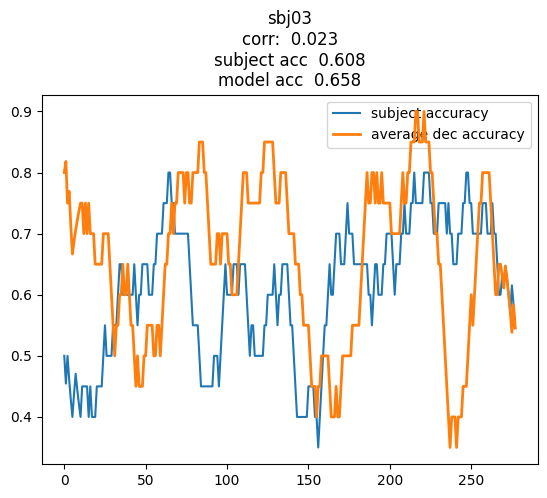

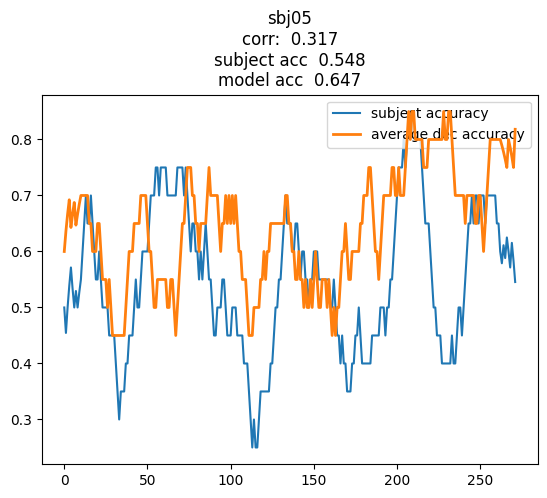

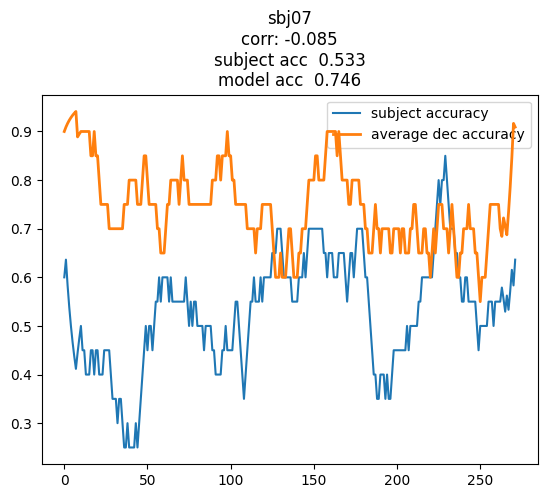

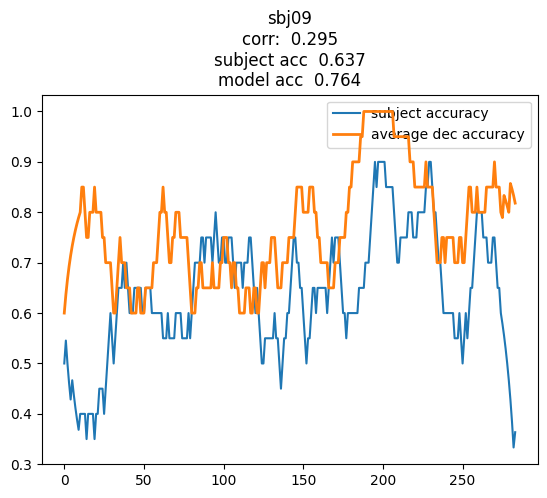

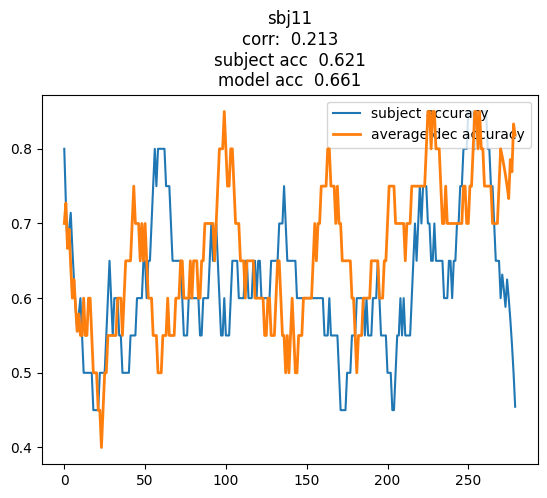

...

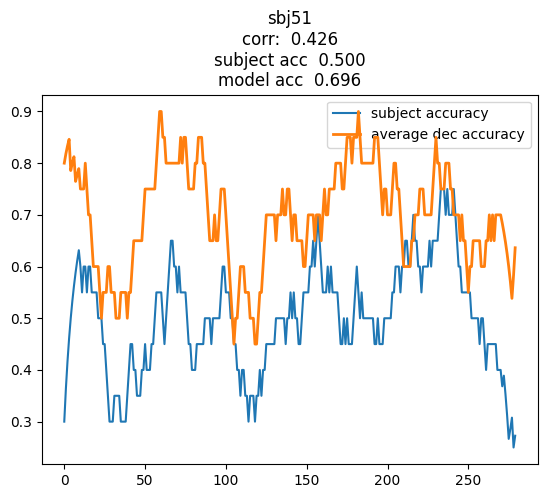

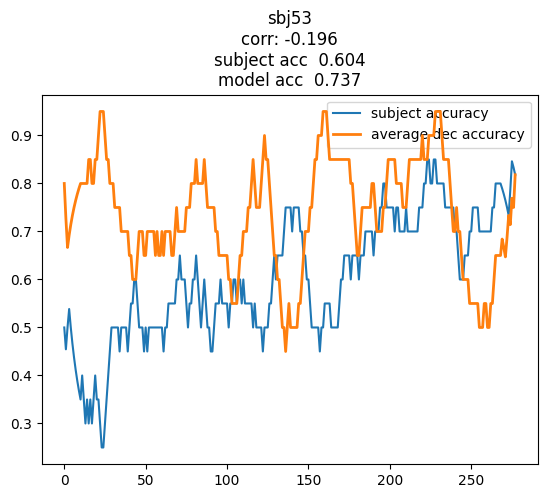

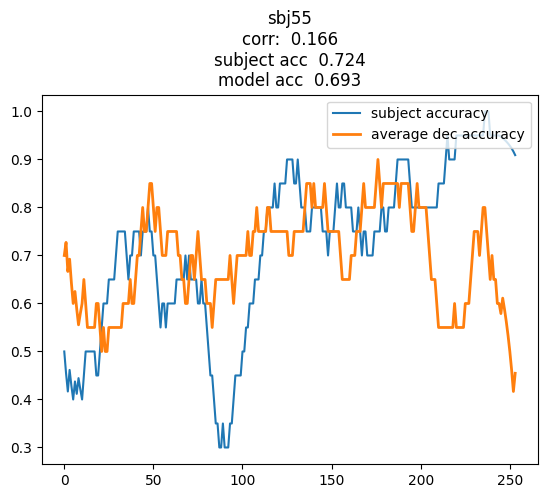

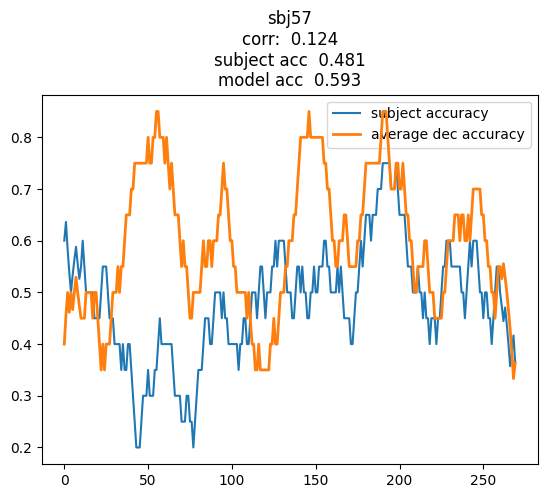

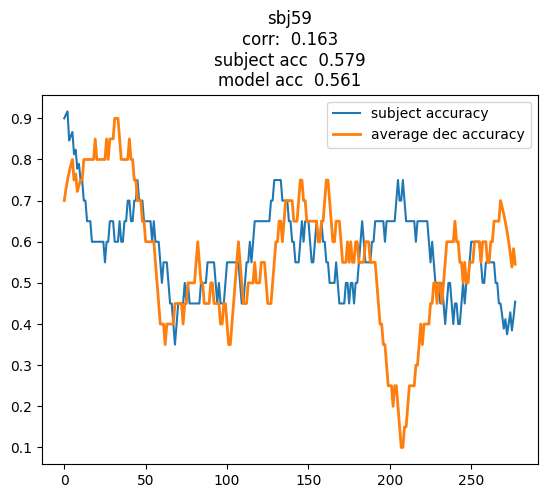

In [37]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '090823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60},
    # win_size=40
)

print(
    'Learn odd, test even\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

for s in cv_subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

Learn odd, test even
 mean abs corr:  0.196; mean corr:  0.032; mean subject acc:  0.662; mean model acc:  0.691;


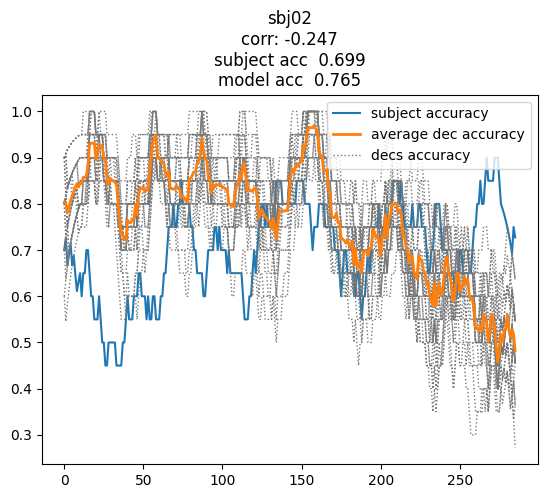

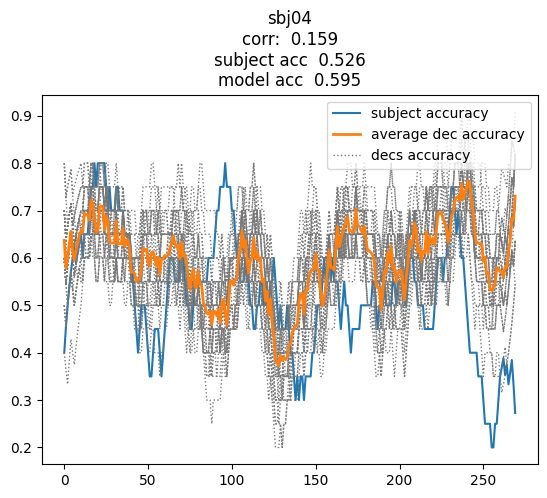

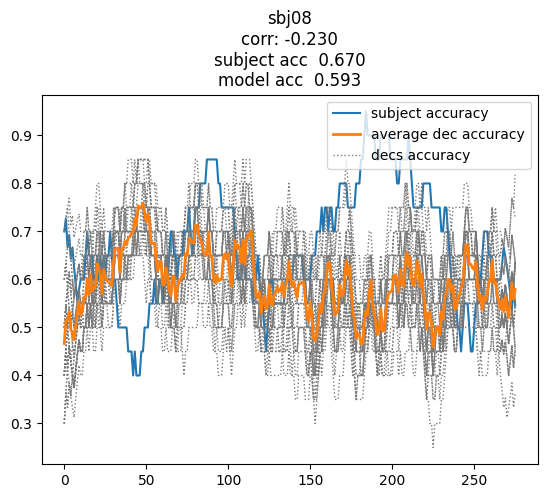

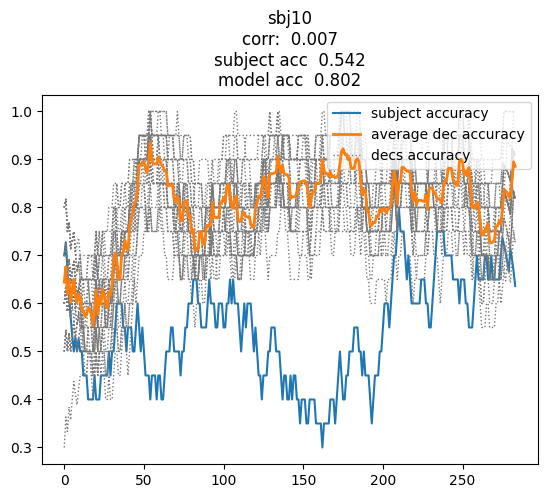

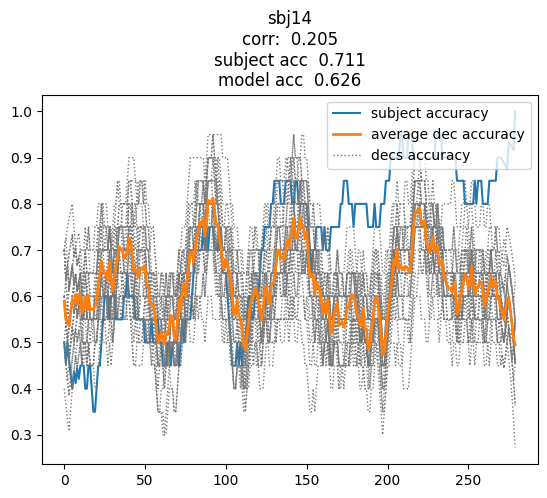

...

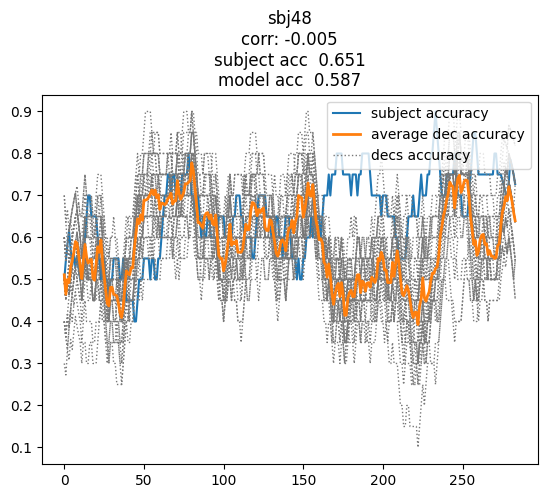

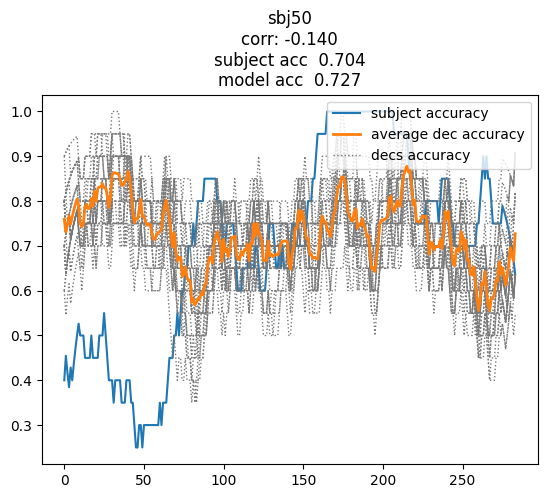

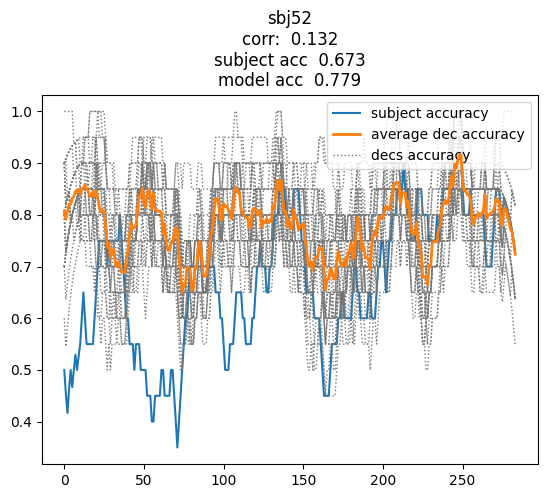

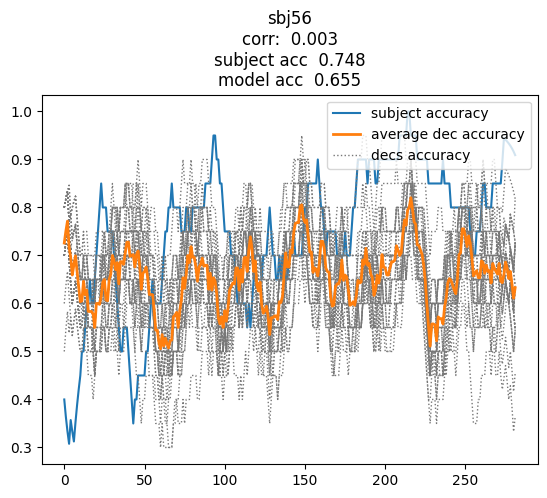

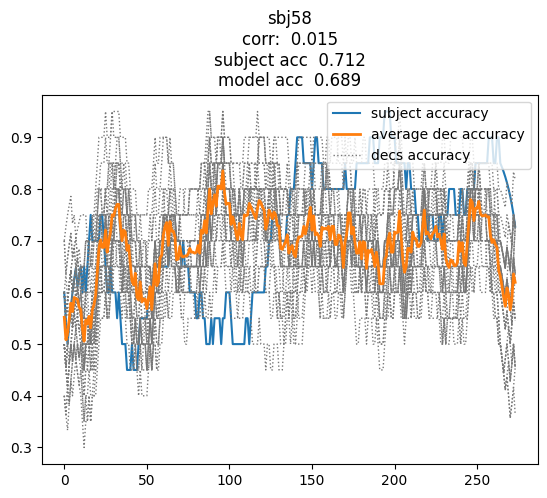

In [38]:
print(
    'Learn odd, test even\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)

for s in subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    for a in s.accs:
        plt.plot(a, color='#777', linewidth=1, linestyle=':')
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

In [37]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60},
    win_size=40
)

Learn even, test odd
 mean abs corr:  0.477; mean corr:  0.444; mean subject acc:  0.662; mean model acc:  0.696;


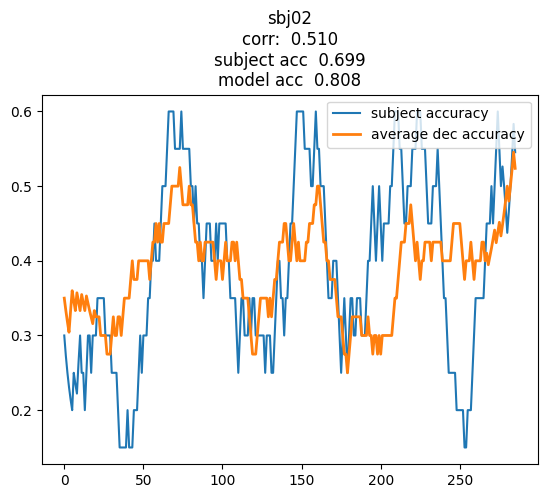

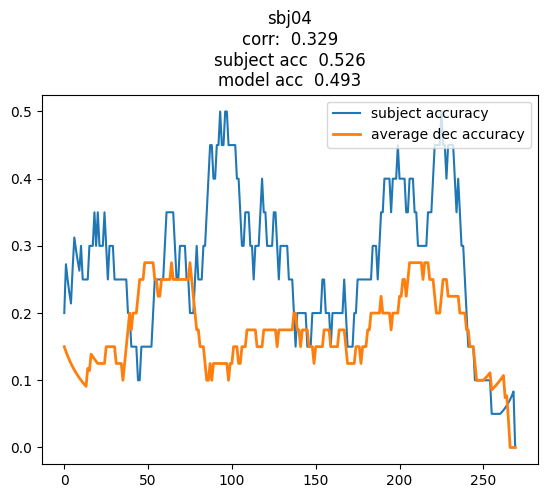

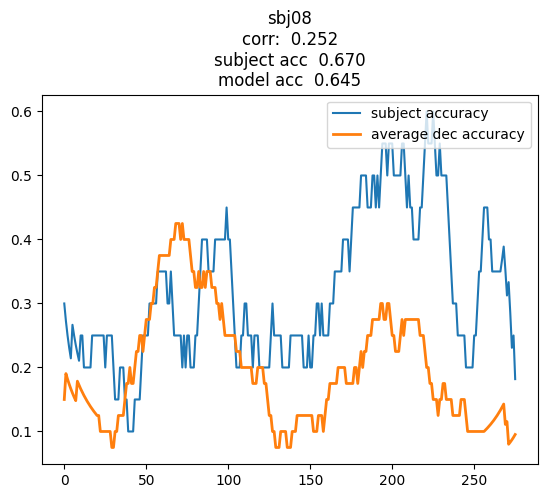

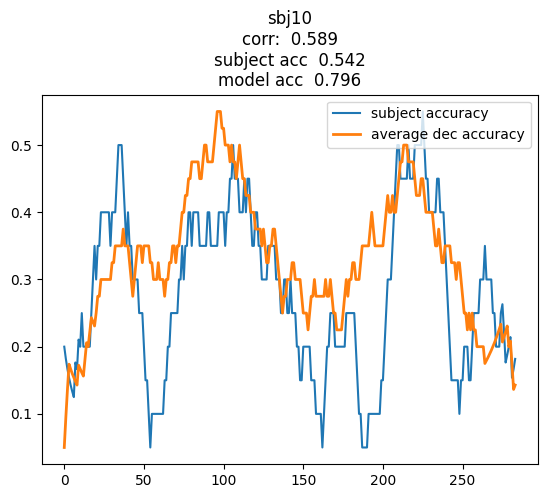

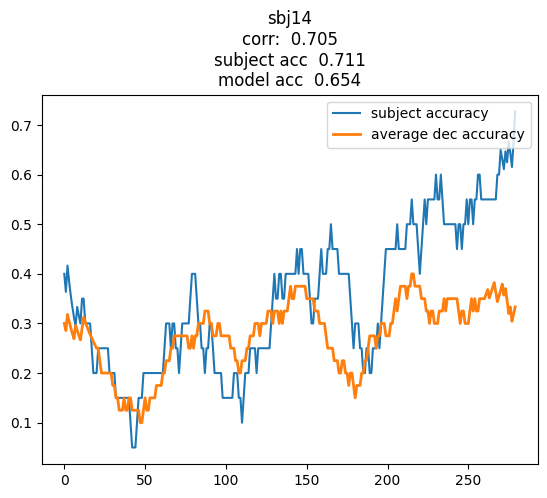

...

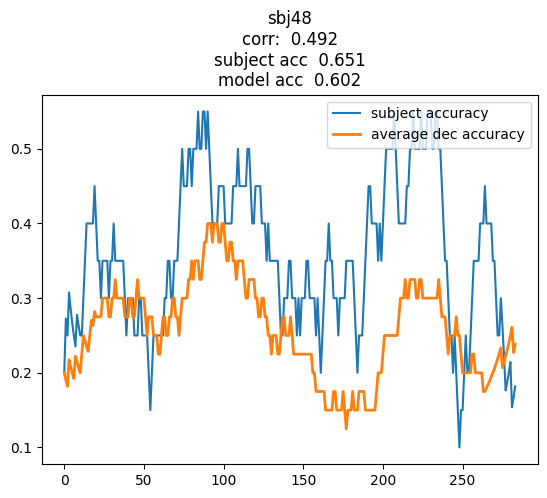

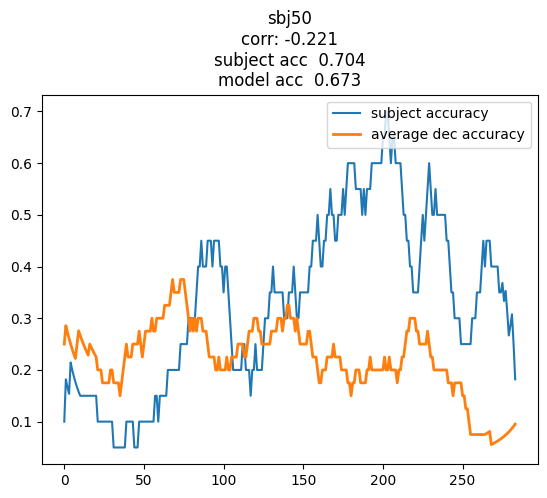

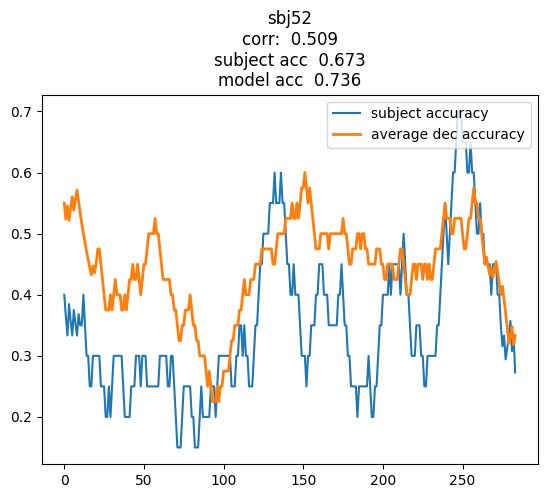

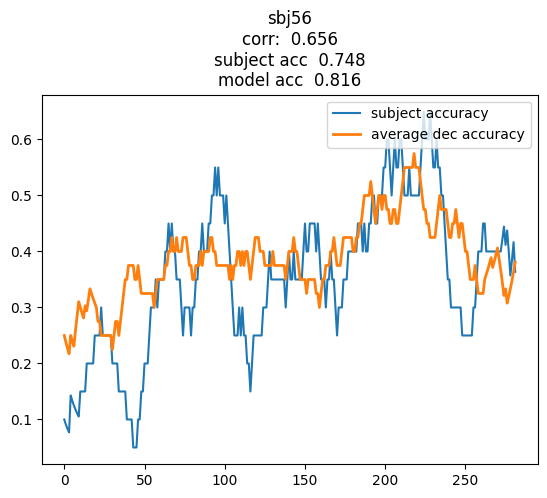

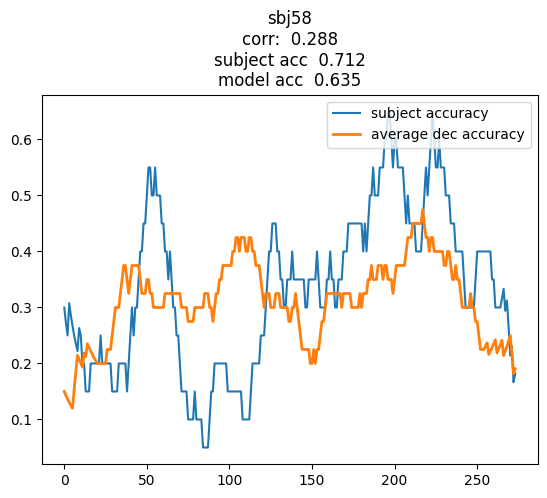

In [38]:
print(
    'Learn even, test odd\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

for s in cv_subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

Learn even, test odd
 mean abs corr:  0.357; mean corr:  0.350; mean subject acc:  0.600; mean model acc:  0.691;


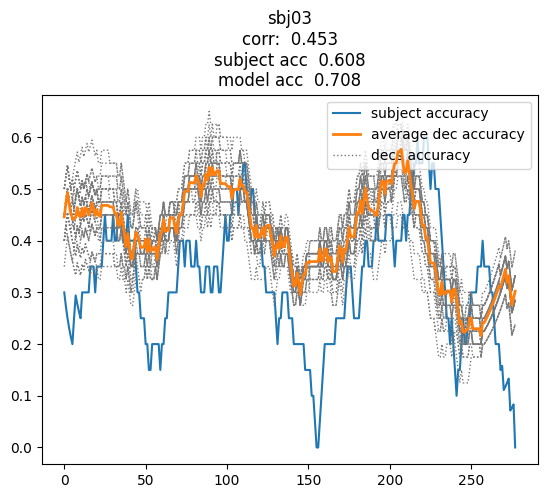

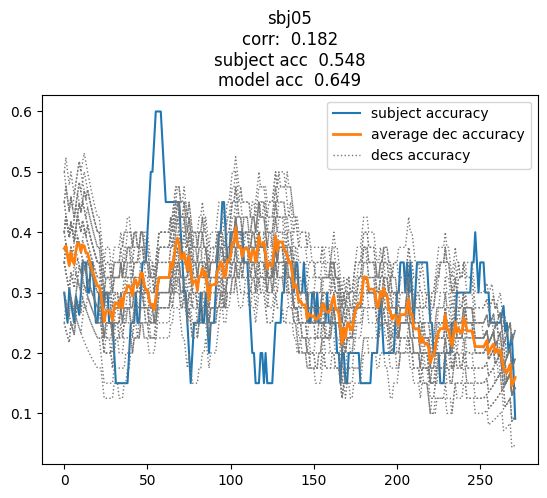

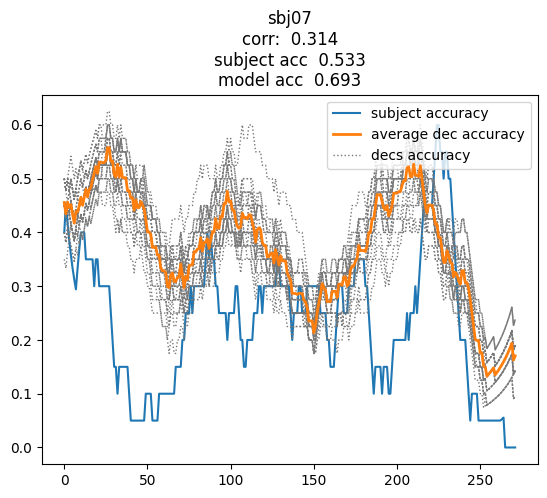

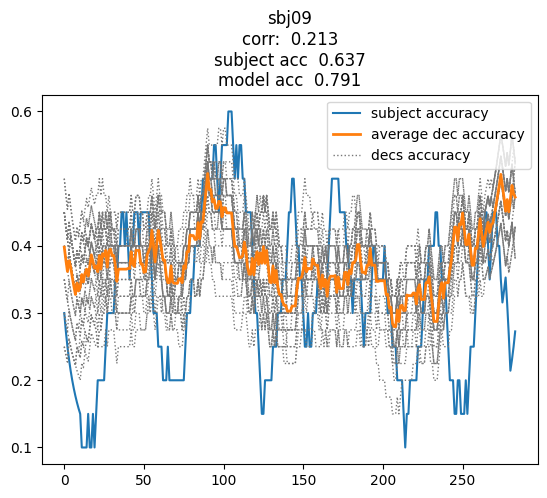

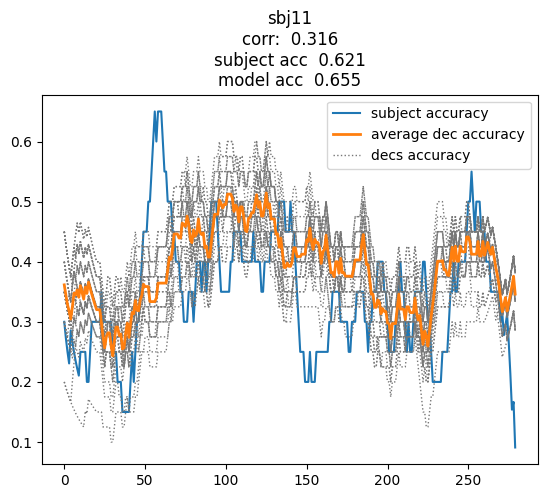

...

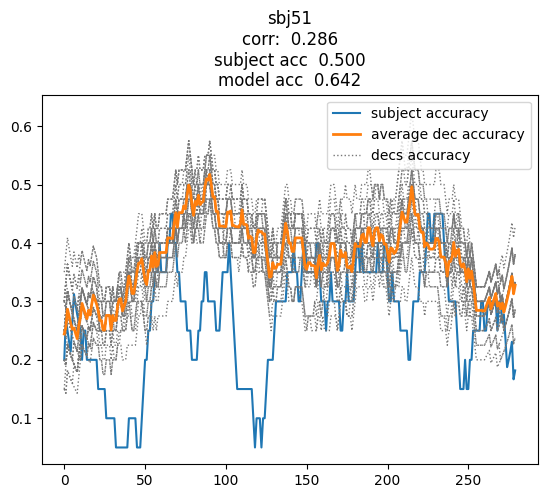

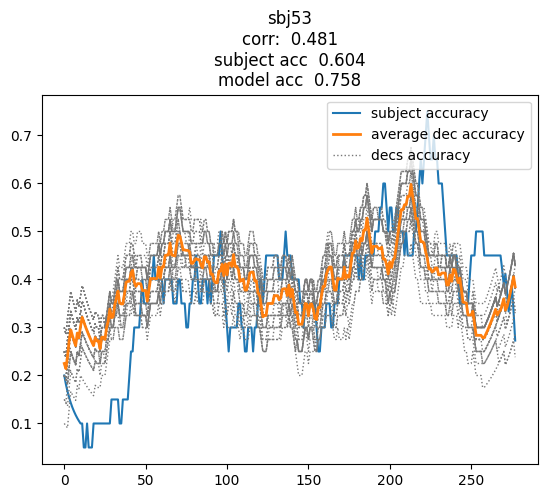

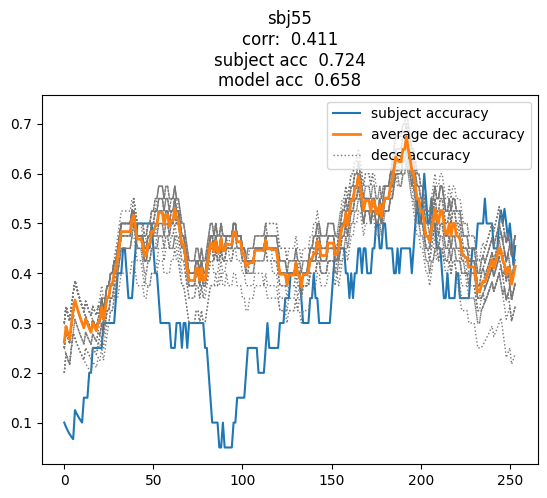

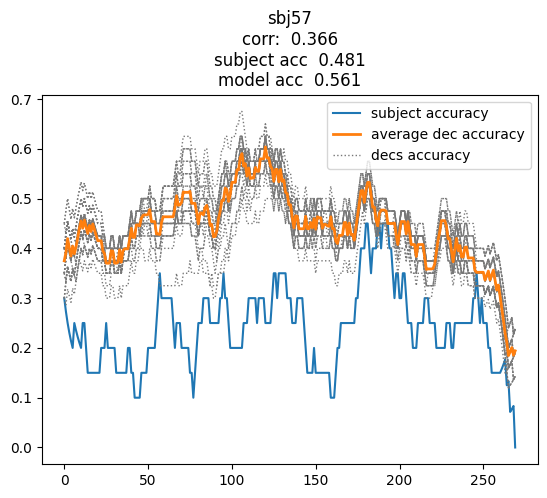

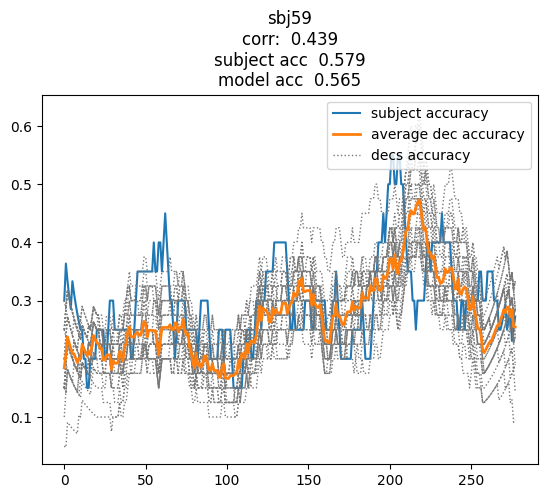

In [39]:
print(
    'Learn even, test odd\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)

for s in subjects:
    plt.title(f'{s.name}\ncorr: {np.mean(s.corrs): .3f}\nsubject acc {s.perf: .3f}\nmodel acc {np.mean(s.perfs): .3f}')
    plt.plot(s.acc)
    plt.plot(np.array(s.accs).mean(0), color='tab:orange', linewidth=2, linestyle='-', zorder=10)
    for a in s.accs:
        plt.plot(a, color='#777', linewidth=1, linestyle=':')
    plt.legend(['subject accuracy', 'average dec accuracy', 'decs accuracy'], loc='upper right')
    plt.show()

### 1st half and 2nd half splitted

In [27]:
def correl(x, y):
    corr = np.corrcoef(x, y)[0, 1]
    if np.isnan(corr):
        print(x)
        print(y)
        corr = 0
    return corr

import numpy as np

def binary_cross_entropy(y_true, y_pred):
    epsilon = 1e-15  # Small constant to prevent division by zero
    y_pred = np.clip(y_pred, epsilon, 1 - epsilon)  # Clip predicted values to avoid extreme values
    bce = - (y_true * np.log(y_pred) + (1 - y_true) * np.log(1 - y_pred))
    mean_bce = np.mean(bce)
    return mean_bce

In [28]:
# measure_fun = lambda x, y: np.corrcoef(x, y)[0, 1]
# measure_fun = correl
# measure_fun = lambda x, y: abs(correl(x, y))
measure_fun = binary_cross_entropy
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '090823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60},
    # win_size=40
)
df1 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '090823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60},
    # win_size=40
)
df3 = get_performances_measure(subjects, measure_fun, 'eve2odd_generalized')
df4 = get_performances_measure(cv_subjects, measure_fun, 'eve2odd_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.662845,0.786329,0.752155,0.724587
odd2eve_generalizing,0.696809,0.709434,0.655957,0.703122
eve2odd_generalized,0.688518,0.738018,0.656979,0.713268
eve2odd_generalizing,0.660195,0.791699,0.773120,0.725947


In [39]:
# measure_fun = lambda x, y: np.corrcoef(x, y)[0, 1]
# measure_fun = correl
# measure_fun = lambda x, y: abs(correl(x, y))
# measure_fun = lambda x, y: torch.nn.functional.binary_cross_entropy(torch.tensor(x).to(torch.float32), torch.tensor(y).to(torch.float32)).item()
# measure_fun = binary_cross_entropy
measure_fun = lambda x, y: x.sum()/len(y)
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '090823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60},
    # win_size=40
)
df1 = get_feedbacks_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_feedbacks_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '090823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60},
    # win_size=40
)
df3 = get_feedbacks_measure(subjects, measure_fun, 'eve2odd_generalized')
df4 = get_feedbacks_measure(cv_subjects, measure_fun, 'eve2odd_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.687579,0.694664,0.693584,0.691121
odd2eve_generalizing,0.691469,0.708456,0.705234,0.699962
eve2odd_generalized,0.686552,0.697167,0.701971,0.691859
eve2odd_generalizing,0.688158,0.719576,0.705206,0.703867


In [56]:
from scipy.stats import chi2_contingency

def compute_chi2_contingency(time_series1, time_series2):
    """
    Compute Chi-square test of independence of variables in a contingency table..

    Args:
        time_series1 (list or np.ndarray): The first categorical time series.
        time_series2 (list or np.ndarray): The second categorical time series.

    Returns:
        result (Chi2ContingencyResult): Test result
    """
    # Create a contingency table
    contingency_table = np.histogram2d(time_series1, time_series2, bins=(len(np.unique(time_series1)), len(np.unique(time_series2))))[0]

    # Calculate chi-squared statistic and p-value
    return chi2_contingency(contingency_table)


def compute_cramers_v(time_series1, time_series2):
    """
    Compute Cramer's V for two categorical time series.

    Args:
        time_series1 (list or np.ndarray): The first categorical time series.
        time_series2 (list or np.ndarray): The second categorical time series.

    Returns:
        cramers_v (float): Cramer's V value.
    """
    # Calculate chi-squared statistic and p-value
    contingency_table = np.histogram2d(time_series1, time_series2, bins=(len(np.unique(time_series1)), len(np.unique(time_series2))))[0]
    chi2, _, _, _ = compute_chi2_contingency(time_series1, time_series2)

    # Calculate Cramer's V
    min_dim = min(contingency_table.shape) - 1
    cramers_v = np.sqrt(chi2 / (len(time_series1) * min_dim))

    return cramers_v

In [61]:
measure_fun = lambda x, y: compute_cramers_v(x, y)
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60},
    win_size=40
)
df1 = get_feedbacks_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_feedbacks_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60},
    win_size=40
)
df3 = get_feedbacks_measure(subjects, measure_fun, 'eve2odd_generalized')
df4 = get_feedbacks_measure(cv_subjects, measure_fun, 'eve2odd_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.088980,0.069682,0.072742,0.054192
odd2eve_generalizing,0.063863,0.068362,0.083323,0.057344
eve2odd_generalized,0.070783,0.083313,0.088496,0.067372
eve2odd_generalizing,0.078412,0.074004,0.062845,0.045552


In [62]:
measure_fun = lambda x, y: sp.stats.spearmanr(x, y).statistic
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60},
    win_size=40
)
df1 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60},
    win_size=40
)
df3 = get_performances_measure(subjects, measure_fun, 'eve2odd_generalized')
df4 = get_performances_measure(cv_subjects, measure_fun, 'eve2odd_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.529827,0.667268,0.496363,0.559399
odd2eve_generalizing,0.449855,0.551028,0.440865,0.485622
eve2odd_generalized,0.497170,0.512386,0.438517,0.511309
eve2odd_generalizing,0.523081,0.702520,0.492905,0.579896


In [69]:
measure_fun = lambda x, y: sp.stats.linregress(x, y).slope
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df1 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df3 = get_performances_measure(subjects, measure_fun, 'eve2odd_generalized')
df4 = get_performances_measure(cv_subjects, measure_fun, 'eve2odd_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.092690,0.192483,0.307499,0.184862
odd2eve_generalizing,0.084088,0.018172,0.020022,0.072778
eve2odd_generalized,0.122028,0.008087,0.005154,0.078295
eve2odd_generalizing,0.019274,0.230553,0.169505,0.152541


In [10]:
def get_seed_measure(subjects: list[SubjectStat], measure_fun: Callable[[Sequence[float], Sequence[float]], float], name: str = 'perf_stat') -> pd.DataFrame:
    measure_1st_half, measure_2nd_half, measure_middle, measure_full = list(), list(), list(), list()
    for subject in subjects:
        measure_1st_half.append(np.array([measure_fun(acc[:len(acc)//2], subject.seed_smooth[:len(acc)//2]) for acc in subject.accs]))
        measure_2nd_half.append(np.array([measure_fun(acc[len(acc)//2:], subject.seed_smooth[len(acc)//2:]) for acc in subject.accs]))
        measure_middle.append(np.array([measure_fun(acc[len(acc)//4:-len(acc)//4], subject.seed_smooth[len(acc)//4:-len(acc)//4]) for acc in subject.accs]))
        measure_full.append(np.array([measure_fun(acc, subject.seed_smooth) for acc in subject.accs]))

    return pd.DataFrame(
        [[np.array(measure_1st_half).mean(), np.array(measure_2nd_half).mean(), np.array(measure_middle).mean(), np.array(measure_full).mean()]],
        columns=['1st_half', '2nd_half', 'middle', 'full'],
        index=[name]
    )

In [12]:
measure_fun = lambda x, y: np.corrcoef(x, y)[0, 1]
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df1 = get_seed_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_seed_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '010823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df3 = get_seed_measure(subjects, measure_fun, 'eve2odd_generalized')
df4 = get_seed_measure(cv_subjects, measure_fun, 'eve2odd_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.732015,0.751723,0.653746,0.733585
odd2eve_generalizing,0.689864,0.750188,0.620735,0.710841
eve2odd_generalized,0.731626,0.787723,0.715123,0.757272
eve2odd_generalizing,0.696061,0.771769,0.607368,0.725832


In [49]:
len(list(range(1, 16)) + list(range(31, 46)))

30

In [48]:
', '.join(map(lambda x: str(x), list(range(1, 16)) + list(range(31, 46))))

'1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45'

## S vs C stim

In [71]:
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60}
)

print(
    'Learn odd, test even (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn odd, test even (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60}
)

print(
    'Learn even, test odd (generalized)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in subjects]).mean() : .3f};',
)
print(
    'Learn even, test odd (generalizing)\n',
    f'mean abs corr: {np.abs(np.array([s.corrs for s in cv_subjects])).mean() : .3f};',
    f'mean corr: {np.array([s.corrs for s in cv_subjects]).mean() : .3f};',
    f'mean subject acc: {np.array([s.perf for s in cv_subjects]).mean() : .3f};',
    f'mean model acc: {np.array([s.perfs for s in cv_subjects]).mean() : .3f};',
)

Learn odd, test even (generalized)
 mean abs corr:  0.228; mean corr:  0.172; mean subject acc:  0.662; mean model acc:  0.652;
Learn odd, test even (generalizing)
 mean abs corr:  0.262; mean corr:  0.111; mean subject acc:  0.600; mean model acc:  0.667;
Learn even, test odd (generalized)
 mean abs corr:  0.228; mean corr:  0.120; mean subject acc:  0.600; mean model acc:  0.647;
Learn even, test odd (generalizing)
 mean abs corr:  0.210; mean corr:  0.138; mean subject acc:  0.662; mean model acc:  0.672;


In [38]:
measure_fun = lambda x, y: compute_chi2_contingency(x, y).pvalue

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df1 = get_feedbacks_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_feedbacks_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df3 = get_feedbacks_measure(subjects, measure_fun, 'odd2eve_generalized')
df4 = get_feedbacks_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.633358,0.668938,0.611825,0.589160
odd2eve_generalizing,0.574055,0.543529,0.550131,0.549235
odd2eve_generalized,0.593156,0.541582,0.666815,0.534514
odd2eve_generalizing,0.557946,0.670954,0.575009,0.535349


In [4]:
measure_fun = lambda x, y: np.corrcoef(x, y)[0, 1]
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df1 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df3 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df4 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.121566,0.171117,0.191017,0.171500
odd2eve_generalizing,0.130674,0.074234,0.025859,0.111070
odd2eve_generalized,0.133421,0.061430,0.075152,0.120474
odd2eve_generalizing,0.114177,0.133616,0.117152,0.137817


In [8]:
measure_fun = lambda x, y: sp.stats.spearmanr(x, y).statistic
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df1 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df3 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df4 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.121285,0.174535,0.191474,0.181465
odd2eve_generalizing,0.118096,0.051186,0.013786,0.096966
odd2eve_generalized,0.127149,0.040968,0.061701,0.106479
odd2eve_generalizing,0.127976,0.149293,0.140435,0.152848


In [9]:
measure_fun = lambda x, y: sp.stats.linregress(x, y).slope
subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_odd2eve_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(2, 60, 2)),
    generalizing_subjects = list(range(1, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df1 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df2 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

subjects, cv_subjects = get_subjects_stat(
    path = '/data/pt_02648/spatual/RESULTS',
    taskname = '020823_eve2odd_training_s_vs_c_lfcnn',
    generalized_subjects = list(range(1, 60, 2)),
    generalizing_subjects = list(range(2, 60, 2)),
    excluded_subjects = {12, 54, 60}
)
df3 = get_performances_measure(subjects, measure_fun, 'odd2eve_generalized')
df4 = get_performances_measure(cv_subjects, measure_fun, 'odd2eve_generalizing')

pd.concat([df1, df2, df3, df4], axis=0)

,1st_half,2nd_half,middle,full
odd2eve_generalized,0.136624,0.169313,0.258267,0.218915
odd2eve_generalizing,0.143997,0.054092,0.007872,0.125396
odd2eve_generalized,0.131342,0.050312,0.072869,0.133225
odd2eve_generalizing,0.125203,0.151896,0.165275,0.172888
